# Grayscale Image Dimensionality Reduction

*Our goal is to compress a grayscale image by reducing the amount of pixels needed for its formation via PCA. First, let us import the project dependencies.*

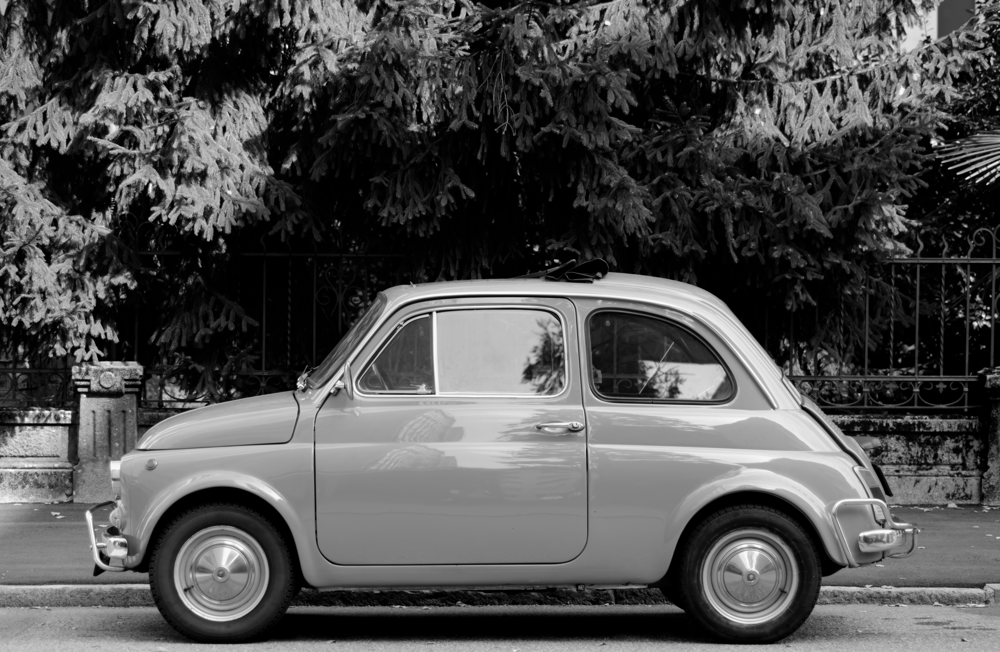

In [1]:
import numpy as np
from PIL import Image
from IPython.display import display

img = Image.open('car.jpg').convert('L')
display(img)

*Convert the image to a numpy array. Note the pixel values for a grayscale image are in the range [0, 255], also known as uint8.*

In [2]:
array = np.array(img)
array.shape

(3206, 4912)

In [3]:
array

array([[175, 175, 175, ...,  62,  64,  60],
       [174, 175, 176, ...,  89,  86,  83],
       [174, 175, 176, ...,  97,  95,  94],
       ...,
       [188, 181, 180, ..., 168, 174, 181],
       [186, 185, 178, ..., 170, 169, 178],
       [192, 191, 185, ..., 170, 169, 181]], dtype=uint8)

*Treat this as array as having 4912 observations with each being 3206 dimensional. Now, we need to find the mean of each dimension (row) and resize it to the same size as the original array. We will do the same for the standard deviation and use both to demean and standardise the data*

In [4]:
rawMean = np.mean(array, axis = 1)
mean = np.zeros(shape=(array.shape[0],array.shape[1]))

for i in range(array.shape[0]):
    temp = [rawMean[i]] * array.shape[1]
    mean[i] = temp

print(mean)
print(mean.shape)

[[ 72.20948697  72.20948697  72.20948697 ...  72.20948697  72.20948697
   72.20948697]
 [ 72.33550489  72.33550489  72.33550489 ...  72.33550489  72.33550489
   72.33550489]
 [ 72.59690554  72.59690554  72.59690554 ...  72.59690554  72.59690554
   72.59690554]
 ...
 [181.83876221 181.83876221 181.83876221 ... 181.83876221 181.83876221
  181.83876221]
 [182.69360749 182.69360749 182.69360749 ... 182.69360749 182.69360749
  182.69360749]
 [183.29397394 183.29397394 183.29397394 ... 183.29397394 183.29397394
  183.29397394]]
(3206, 4912)


In [5]:
rawStdDev = np.var(array, axis = 1)**0.5
stdDev = np.zeros(shape=(array.shape[0],array.shape[1]))

for i in range(array.shape[0]):
    temp = [rawStdDev[i]] * array.shape[1]
    stdDev[i] = temp

print(stdDev)
print(stdDev.shape)

[[60.36856034 60.36856034 60.36856034 ... 60.36856034 60.36856034
  60.36856034]
 [60.08551704 60.08551704 60.08551704 ... 60.08551704 60.08551704
  60.08551704]
 [59.72051811 59.72051811 59.72051811 ... 59.72051811 59.72051811
  59.72051811]
 ...
 [ 9.63123291  9.63123291  9.63123291 ...  9.63123291  9.63123291
   9.63123291]
 [ 9.30272498  9.30272498  9.30272498 ...  9.30272498  9.30272498
   9.30272498]
 [ 9.05605397  9.05605397  9.05605397 ...  9.05605397  9.05605397
   9.05605397]]
(3206, 4912)


In [6]:
Xbar = (array - mean)/stdDev
Xbar

array([[ 1.70271599,  1.70271599,  1.70271599, ..., -0.16911927,
        -0.13598944, -0.2022491 ],
       [ 1.69199668,  1.70863962,  1.72528257, ...,  0.27734629,
         0.22741745,  0.17748861],
       [ 1.69796073,  1.71470539,  1.73145006, ...,  0.40862161,
         0.37513229,  0.35838762],
       ...,
       [ 0.63971434, -0.08708773, -0.1909166 , ..., -1.436863  ,
        -0.8138898 , -0.08708773],
       [ 0.35542193,  0.24792655, -0.50454114, ..., -1.36450422,
        -1.4719996 , -0.50454114],
       [ 0.96134874,  0.85092537,  0.18838515, ..., -1.46796541,
        -1.57838878, -0.25330833]])

**With our newly demeaned and standardised data, let us calculate the covariance matrix**

In [7]:
S = (Xbar @ Xbar.T)/Xbar.shape[1]
S

array([[ 1.        ,  0.99098372,  0.97784411, ..., -0.13666684,
        -0.1332421 , -0.10002942],
       [ 0.99098372,  1.        ,  0.9936283 , ..., -0.13672039,
        -0.13166272, -0.09620138],
       [ 0.97784411,  0.9936283 ,  1.        , ..., -0.13586023,
        -0.12836199, -0.09182183],
       ...,
       [-0.13666684, -0.13672039, -0.13586023, ...,  1.        ,
         0.81511274,  0.58908618],
       [-0.1332421 , -0.13166272, -0.12836199, ...,  0.81511274,
         1.        ,  0.84234834],
       [-0.10002942, -0.09620138, -0.09182183, ...,  0.58908618,
         0.84234834,  1.        ]])

*Find the eigenvalues & eigenvectors of S and sort them in descending order. Note that numpy returns the normalized eigenvectors*

In [8]:
eigvals, eigvecs = np.linalg.eig(S)
sort_indices = np.argsort(eigvals)[::-1]
eigvals = eigvals[sort_indices]
eigvecs = eigvecs[:, sort_indices]

*Obtain the 40 largest eigenvalues and their corresponding eigenvectors. Create the basis B and use it to find the projection matrix. We do not need to use P = B @ np.linalg.inv(B.T @ B) @ B.T as B's column vectors are orthogonal. We can easily check that B.T @ B is very close to the identity matrix.*

**Use the projection matrix to find our solution and display the resulting image. This image can be represented as a 20 dimensional object but we have turned it into it original size for viewing purposes. From 3206, we now only need 20 dimensions to display the image which can still be made out to be a car by the naked eye!**

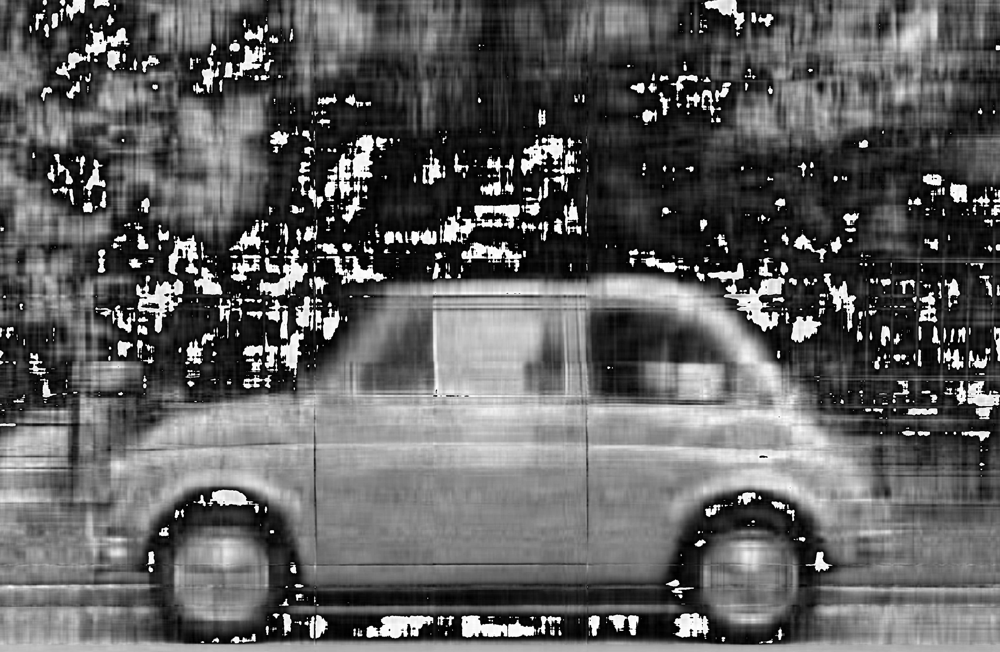

In [9]:
principal_vals, principal_components = eigvals[:20], eigvecs[:, :20]
B = principal_components
P = B @ B.T
projection = (P @ Xbar) * stdDev + mean
projection = projection.astype(np.uint8)
display(Image.fromarray(projection))

### This is essentially what the implementation in scikit learn does as shown below.

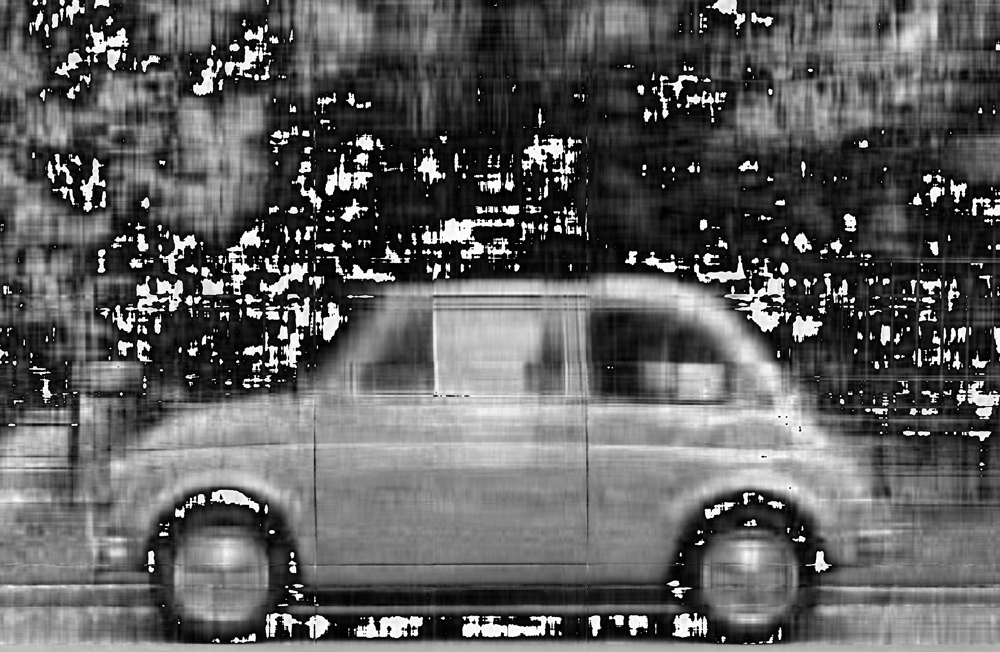

In [10]:
from sklearn.decomposition import PCA
pca = PCA(n_components=20)
code = pca.fit_transform(Xbar)
projection = (pca.inverse_transform(code) * stdDev + mean)
projection = projection.astype(np.uint8)

display(Image.fromarray(projection))